<a href="https://colab.research.google.com/github/JohnalEco/Hurtos_Medellin/blob/main/Machine_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [90]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', message='.*find_spec() not found; falling back to find_module().*')
warnings.filterwarnings('ignore', category=ImportWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [91]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

In [92]:
 drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [201]:
hurto_a_persona = pd.read_csv("/content/drive/MyDrive/hurtos/hurto_a_persona.csv")
hurto_a_persona['fecha_hecho'] = pd.to_datetime(hurto_a_persona['fecha_hecho'])
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")

<ipython-input-201-8f3a9634632f>:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  hurto_a_persona = pd.read_csv("/content/drive/MyDrive/hurtos/hurto_a_persona.csv")


In [202]:
# Definir los años de interés
año_inicio = 2022
año_fin = 2022

# Filtrar los datos por los años de interés
hurto_a_persona = hurto_a_persona[
    (hurto_a_persona['fecha_hecho'].dt.year >= año_inicio) &
    (hurto_a_persona['fecha_hecho'].dt.year <= año_fin)
]


In [198]:

media_lat = hurto_a_persona['latitud'].mean()
std_lat = hurto_a_persona['latitud'].std()

media_long = hurto_a_persona['longitud'].mean()
std_long = hurto_a_persona['longitud'].std()

factor = 2

limite_inferior_lat = media_lat - factor * std_lat
limite_superior_lat = media_lat + factor * std_lat

limite_inferior_long = media_long - factor * std_long
limite_superior_long = media_long + factor * std_long

hurto_a_persona_filtrado = hurto_a_persona[
    (hurto_a_persona['latitud'] >= limite_inferior_lat) &
    (hurto_a_persona['latitud'] <= limite_superior_lat) &
    (hurto_a_persona['longitud'] >= limite_inferior_long) &
    (hurto_a_persona['longitud'] <= limite_superior_long)
]

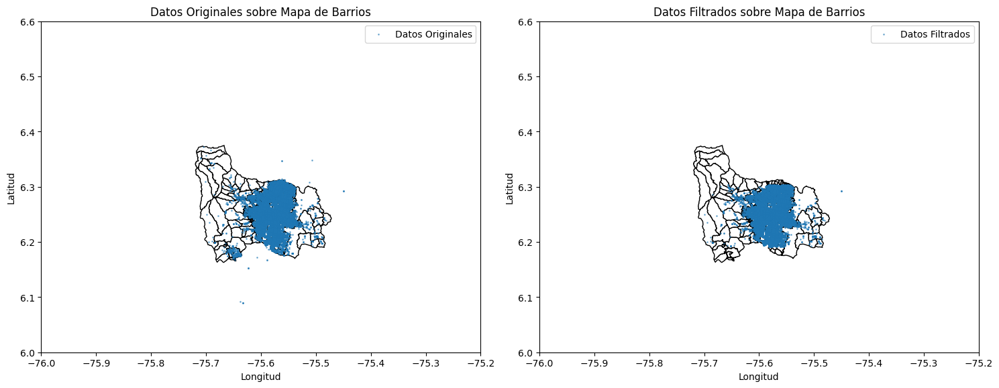

In [199]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))


barrios.plot(ax=ax1, edgecolor='black', color='white')
ax1.scatter(hurto_a_persona['longitud'], hurto_a_persona['latitud'], s=1, alpha=0.5, label='Datos Originales')
ax1.set_title('Datos Originales sobre Mapa de Barrios')
ax1.set_xlabel('Longitud')
ax1.set_ylabel('Latitud')
ax1.set_xlim(-76, -75.2)
ax1.set_ylim(6, 6.6)
ax1.legend()

barrios.plot(ax=ax2, edgecolor='black', color='white')
ax2.scatter(hurto_a_persona_filtrado['longitud'], hurto_a_persona_filtrado['latitud'], s=1, alpha=0.5, label='Datos Filtrados')
ax2.set_title('Datos Filtrados sobre Mapa de Barrios')
ax2.set_xlabel('Longitud')
ax2.set_ylabel('Latitud')
ax2.set_xlim(-76, -75.2)
ax2.set_ylim(6, 6.6)
ax2.legend()

plt.tight_layout()
plt.show()
hurto_a_persona = hurto_a_persona_filtrado

In [203]:
mapeo_categorias = {
    'Vía pública': 'Transporte',
    'Terminal de transporte': 'Transporte',
    'Estación del Metro': 'Transporte',
    'Estación del Metro plus': 'Transporte',
    'Paradero de bus': 'Transporte',
    'Aeropuerto': 'Transporte',
    'Puente peatonal': 'Transporte',
    'Metro Plus': 'Transporte',
    'Peaje': 'Transporte',
    'Institución de educación superior': 'Educación',
    'Institución educativa (jardín, primaria o secundaria)': 'Educación',
    'Residencia': 'Residencial',
    'Casa o apartamento': 'Residencial',
    'Conjunto residencial': 'Residencial',
    'Caseta vigilancia conjunto residencial': 'Residencial',
    'Centro comercial': 'Comercial',
    'Local comercial': 'Comercial',
    'Supermercado': 'Comercial',
    'Almacén tienda y otro': 'Comercial',
    'Plaza de mercado': 'Comercial',
    'Joyería': 'Comercial',
    'Compraventa': 'Comercial',
    'Bar o cantina': 'Entretenimiento',
    'Casino': 'Entretenimiento',
    'Teatro': 'Entretenimiento',
    'Parque': 'Entretenimiento',
    'Escenario deportivo': 'Entretenimiento',
    'Gimnasio': 'Entretenimiento',
    'Estadero': 'Entretenimiento',
    'Hospital o centro de salud': 'Salud',
    'Oficina': 'Servicios',
    'Hotel, motel y hostal': 'Servicios',
    'Restaurante': 'Servicios',
    'Taller mecánico': 'Servicios',
    'Droguería o farmacia': 'Servicios',
    'Biblioteca': 'Servicios',
    'Cementerio': 'Servicios',
    'Instalación judicial': 'Servicios',
    'Panadería': 'Servicios',
    'Instalación fuerza pública': 'Servicios',
    'Sede social, club, auditorio o similar': 'Servicios',
    'Funeraria y sala de velación': 'Servicios',
    'Baño': 'Servicios',
    'Sede política': 'Servicios',
    'Cafetería': 'Servicios',
    'Café internet': 'Servicios',
    'Consultorio jurídico': 'Servicios',
    'Lavadero de carros': 'Servicios',
    'Obra en construcción': 'Otros',
    'Quebrada o rio': 'Otros',
    'Reserva natural': 'Otros',
    'Lote baldío': 'Otros',
    'Potrero': 'Otros',
    'Matadero, carnicería y similar': 'Otros',
    'Hipodromo': 'Otros',
    'Cantera': 'Otros',
    'Finca': 'Otros',
    'Feria de ganado': 'Otros',
    'Desguazadero': 'Otros',
    'Sin dato': 'Otros',
    'Fábrica o empresa': 'Industria',
    'Vehículo particular': 'Transporte',
    'Parqueadero': 'Comercial',
    'Banco': 'Servicios',
    'Bus de servicio público': 'Transporte',
    'Estación de gasolina': 'Comercial',
    'Casa de apuesta': 'Entretenimiento',
    'Piscina': 'Entretenimiento',
    'Bodega': 'Comercial',
    'Iglesia': 'Religioso',
    'Edificio': 'Comercial',
    'Cajero electrónico': 'Servicios',
    'Instalación gubernamental': 'Servicios',
    'Centro de belleza o estética': 'Servicios',
    'Plaza de toros': 'Entretenimiento',
    'Turístico': 'Entretenimiento',
    'Caseta de vigilancia empresa': 'Seguridad',
    'Laboratorios de procesamiento de droga ílicita': 'Salud',
    'Montallanta': 'Servicios',
    'Corporación': 'Servicios',
    'Cárcel': 'Seguridad',
    'Hogar de paso': 'Residencial',
    'Billar': 'Entretenimiento',
    'Albergue': 'Residencial',
    'Zona boscosa': 'Otros',
    'Empresa de transporte': 'Transporte',
    'Puesto de trabajo': 'Otros',
    'Prostíbulo': 'Entretenimiento',
    'Librería': 'Comercial',
    'Metro': 'Transporte',
    'Represa o laguna': 'Otros'
}

hurto_a_persona['lugar_agrupado'] = hurto_a_persona['lugar'].map(mapeo_categorias)


In [204]:
mapeo_modalidades = {
    'Atraco': 'Robo con Violencia o Amenaza',
    'Descuido': 'Robo con Engaño o Sin Violencia',
    'Cosquilleo': 'Robo con Engaño o Sin Violencia',
    'Raponazo': 'Robo con Violencia o Amenaza',
    'Sin dato': 'Delitos Específicos',
    'Engaño': 'Robo con Engaño o Sin Violencia',
    'Rompimiento cerraduta': 'Robo por Rompimiento o Acceso Forzado',
    'Escopolamina': 'Robo con Engaño o Sin Violencia',
    'Rompimiento de ventana': 'Robo por Rompimiento o Acceso Forzado',
    'Halado': 'Robo con Violencia o Amenaza',
    'Rompimiento cerradura': 'Robo por Rompimiento o Acceso Forzado',
    'Clonación de tarjeta': 'Robo con Engaño o Sin Violencia',
    'Comisión de delito': 'Delitos Específicos',
    'Suplantación': 'Robo con Engaño o Sin Violencia',
    'Paquete chileno': 'Robo con Engaño o Sin Violencia',
    'Abuso de confianza': 'Robo con Engaño o Sin Violencia',
    'Informático': 'Robo con Engaño o Sin Violencia',
    'Llave maestra': 'Robo con Engaño o Sin Violencia',
    'Fleteo': 'Robo con Violencia o Amenaza',
    'Miedo o terror': 'Delitos Específicos',
    'Simulando necesidad': 'Robo con Engaño o Sin Violencia',
    'Retención de tarjeta': 'Delitos Específicos',
    'Llamada millonaria': 'Robo con Engaño o Sin Violencia',
    'Forcejeo': 'Robo con Violencia o Amenaza',
    'Retención de dinero': 'Delitos Específicos',
    'Tóxico o agente químico': 'Robo con Engaño o Sin Violencia',
    'Enfrentamiento con la fuerza pública': 'Delitos Específicos',
    'Auto robo': 'Delitos Específicos',
    'Violencia intrafamiliar': 'Robo con Violencia o Amenaza',
    'Vandalismo': 'Robo por Rompimiento o Acceso Forzado'
}
hurto_a_persona['modalidad'] = hurto_a_persona['modalidad'].map(mapeo_modalidades)

In [205]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

In [206]:
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")

In [207]:
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')

In [208]:
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios)

In [209]:
# Definir los rangos de edad
bins = [0, 18, 30, 45, 60, 100]
labels = ['0-18', '19-30', '31-45', '46-60', '60+']

hurto_barrios['grupo_edad'] = pd.cut(hurto_barrios['edad'], bins=bins, labels=labels, right=False)

In [210]:
hurto_barrios['fecha_hecho'] = pd.to_datetime(hurto_barrios['fecha_hecho'])

In [211]:
hurto_barrios['año_hecho'] = hurto_barrios['fecha_hecho'].dt.year
hurto_barrios['mes_hecho'] = hurto_barrios['fecha_hecho'].dt.month
hurto_barrios['dia_semana_hecho'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['hora'] = hurto_barrios['fecha_hecho'].dt.hour
hurto_barrios['dia_semana'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['mes'] = hurto_barrios['fecha_hecho'].dt.month
hurto_por_mes = hurto_barrios.groupby('mes').size()
hurto_barrios['dia_mes'] = hurto_barrios['fecha_hecho'].dt.day

In [212]:
hurto_barrios["medio_transporte"].unique()

array(['Caminata', 'Motocicleta', 'Automóvil', 'Autobus', 'Taxi', 'Metro',
       'Bicicleta', 'Motocicleta con parrillero', 'Sin dato', 'Planeador'],
      dtype=object)

In [213]:
columnas_datos = ["latitud","longitud","sexo","edad","lugar_agrupado","mes_hecho","dia_semana_hecho","hora","dia_mes","arma_medio","medio_transporte","modalidad","grupo_bien"]
#columnas_datos = ["latitud","longitud","sexo","edad","lugar_agrupado","codigo_comuna","grupo_bien","mes_hecho","dia_semana_hecho","hora","dia_mes"]
datos_regresion = hurto_barrios[columnas_datos]

In [214]:
nan_por_columna = datos_regresion.isna().sum()

# Imprime los resultados
print("Cantidad de NaN por cada columna:")
print(nan_por_columna)

Cantidad de NaN por cada columna:
latitud             0
longitud            0
sexo                0
edad                0
lugar_agrupado      0
mes_hecho           0
dia_semana_hecho    0
hora                0
dia_mes             0
arma_medio          0
medio_transporte    0
modalidad           0
grupo_bien          0
dtype: int64


In [215]:
mapeo_arma_medio = {
    'Arma cortopunzante': 0,
    'No': 1,
    'Sin dato': 2,
    'Arma de fuego': 3,
    'Objeto contundente': 4,
    'Perro': 5,
    'Escopolamina': 6,
    'Llave maestra': 7,
    'Tóxico o Químico': 8,
    'Palanca': 9
}
datos_regresion['arma_medio'] = datos_regresion['arma_medio'].map(mapeo_arma_medio)

<ipython-input-215-af1778468f72>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['arma_medio'] = datos_regresion['arma_medio'].map(mapeo_arma_medio)


In [216]:
mapeo_medio_transporte = {
    'Caminata': 0,
    'Motocicleta': 1,
    'Automóvil': 2,
    'Sin dato': 3,
    'Taxi': 4,
    'Autobus': 5,
    'Metro': 6,
    'Motocicleta con parrillero': 7,
    'Bicicleta': 8,
    'Planeador': 9
}
datos_regresion['medio_transporte'] = datos_regresion['medio_transporte'].map(mapeo_medio_transporte)


<ipython-input-216-c4cc9591e209>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['medio_transporte'] = datos_regresion['medio_transporte'].map(mapeo_medio_transporte)


In [217]:
datos_regresion["grupo_bien"] = datos_regresion["grupo_bien"].map({"Mercancía": 0, "Vehículo": 1, "Equipamiento": 2, "Sin dato":3, "Bélico":4})

<ipython-input-217-5cfb66edaa76>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["grupo_bien"] = datos_regresion["grupo_bien"].map({"Mercancía": 0, "Vehículo": 1, "Equipamiento": 2, "Sin dato":3, "Bélico":4})


In [218]:
datos_regresion['modalidad'] = datos_regresion['modalidad'].astype('category').cat.codes

<ipython-input-218-3ecb3230bab9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['modalidad'] = datos_regresion['modalidad'].astype('category').cat.codes


In [219]:
datos_regresion.dropna(inplace=True)

<ipython-input-219-3f81e3095c70>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion.dropna(inplace=True)


In [220]:
datos_regresion["sexo"] = datos_regresion["sexo"].map({"Hombre": 0, "Mujer": 1})

<ipython-input-220-07571870e321>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["sexo"] = datos_regresion["sexo"].map({"Hombre": 0, "Mujer": 1})


In [221]:
datos_regresion["dia_semana_hecho"] = datos_regresion["dia_semana_hecho"].map({"Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3, "Friday": 4, "Saturday": 5, "Sunday": 6})

<ipython-input-221-7aeb126fd586>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["dia_semana_hecho"] = datos_regresion["dia_semana_hecho"].map({"Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3, "Friday": 4, "Saturday": 5, "Sunday": 6})


In [222]:
datos_regresion = datos_regresion.dropna(subset=['sexo'])

In [223]:
datos_regresion['lugar_agrupado'].unique()

array(['Residencial', 'Servicios', 'Transporte', 'Otros', 'Comercial',
       'Entretenimiento', 'Salud', 'Educación', 'Industria', 'Religioso',
       'Seguridad'], dtype=object)

In [224]:
mapa_numerico = {
    "Transporte": 0,
    "Servicios": 1,
    "Comercial": 2,
    "Otros": 3,
    "Educación": 4,
    "Otros": 5,
    "Residencial": 6,
    "Educación": 7,
    "Entretenimiento": 8,
    "Salud": 9,
    "Industria": 10,
    "Religioso": 11,
    "Seguridad": 12,
}

datos_regresion['lugar_agrupado'] = datos_regresion['lugar_agrupado'].map(mapa_numerico)

In [225]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import xgboost as xgb

In [226]:
x = datos_regresion.drop("modalidad", axis=1)
y = datos_regresion["modalidad"]

In [227]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [228]:
model = XGBClassifier(learning_rate= 0.3,max_depth = 9, n_estimators=150)

In [229]:
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

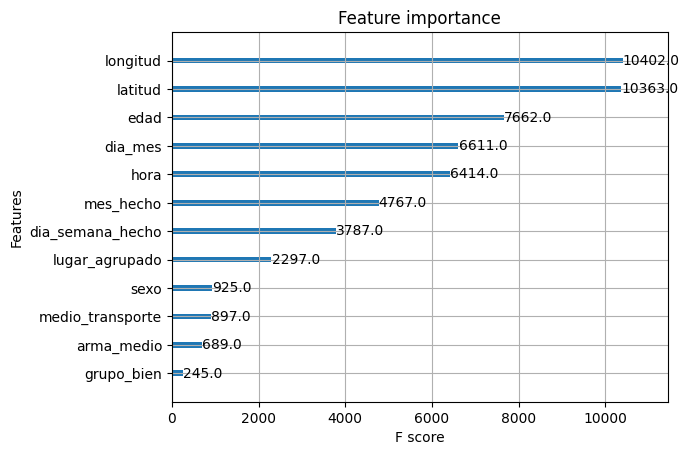

In [230]:
xgb.plot_importance(model, ax = plt.gca())

In [231]:
model.score(X_train, y_train)

0.9997441052823981

In [232]:
model.score(X_test, y_test)

0.8898839986352781

In [233]:
predict = model.predict(X_test)
predict

array([2, 1, 1, ..., 1, 2, 2])

In [234]:
from sklearn.metrics import confusion_matrix

In [235]:
confusion_matrix =confusion_matrix(y_test, predict)

In [236]:
TP = np.diag(confusion_matrix)

# Falsos Positivos (Suma de columnas, menos los verdaderos positivos)
FP = np.sum(confusion_matrix, axis=0) - TP

# Falsos Negativos (Suma de filas, menos los verdaderos positivos)
FN = np.sum(confusion_matrix, axis=1) - TP

# Verdaderos Negativos (Total de la matriz, menos TP, FP, y FN)
TN = np.sum(confusion_matrix) - (FP + FN + TP)

# Exactitud
accuracy = np.sum(TP) / np.sum(confusion_matrix)

# Precisión, Sensibilidad, F1 Score
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f"Exactitud: {accuracy:.2f}")
print(f"Precisión por clase: {precision}")
print(f"Sensibilidad por clase: {recall}")
print(f"F1 Score por clase: {f1_score}")

Exactitud: 0.89
Precisión por clase: [0.91666667 0.81870268 0.94569141 0.8722467 ]
Sensibilidad por clase: [0.14864865 0.92316567 0.89858315 0.64811784]
F1 Score por clase: [0.25581395 0.86780176 0.92153564 0.74366197]


In [237]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN

In [238]:
scaler = StandardScaler()
hurtos_scaled = scaler.fit_transform(datos_regresion)

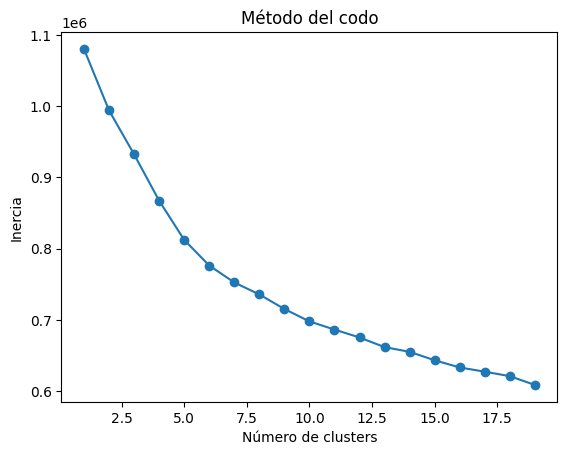

In [137]:
inertias = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(hurtos_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 20), inertias, marker='o')
plt.title('Método del codo')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')
plt.show()

In [239]:
kmeans = KMeans(n_clusters= 20, random_state=0)
datos_regresion['kmeans_cluster'] = kmeans.fit_predict(hurtos_scaled)

In [240]:
cluster_counts = datos_regresion['kmeans_cluster'].value_counts().sort_index()
cluster_counts

kmeans_cluster
0      926
1      855
2     2232
3     2417
4     2083
5     1772
6     2586
7     2710
8     1685
9      949
10    1938
11    1980
12    1965
13    2364
14    2155
15    1904
16    2023
17    3073
18    3224
19     238
Name: count, dtype: int64

In [241]:
hurto_barrios["kmeans_cluster"] = datos_regresion["kmeans_cluster"]

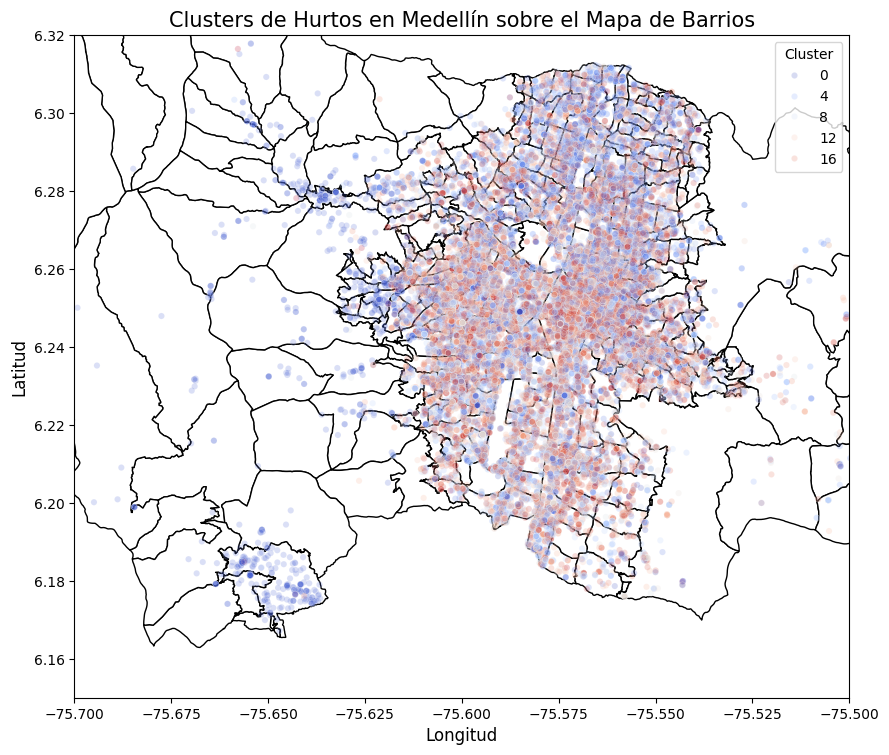

In [242]:
barrios_solo = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")
# Crear un plot de los barrios de Medellín
fig, ax = plt.subplots(figsize=(10, 10))
barrios_solo.plot(ax=ax, edgecolor='black', color='white')

# Ajustar los límites del mapa
ax.set_xlim([-75.70, -75.5])
ax.set_ylim([6.15, 6.32])

# Superponer los puntos de los clusters
sns.scatterplot(
    x='longitud', y='latitud', hue='kmeans_cluster',
    data=hurto_barrios, palette='coolwarm', alpha=0.2, s=20, ax=ax
)

# Mejorar la visualización
plt.title('Clusters de Hurtos en Medellín sobre el Mapa de Barrios', fontsize=15)
plt.xlabel('Longitud', fontsize=12)
plt.ylabel('Latitud', fontsize=12)
plt.legend(title='Cluster', fontsize=10, loc='upper right')
plt.show()

                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.244815 -75.573171  0.141469  -0.332613        0.120950   
1               6.239295 -75.636689  0.291228  34.010526        0.933333   
2               6.247673 -75.578941  1.000000  33.977151        7.288978   
3               6.278266 -75.566440  0.028962  31.594952        0.479520   
4               6.252675 -75.570230  0.007681  32.068651        0.486798   
5               6.243538 -75.575029  1.000000  35.693002        0.289503   
6               6.249525 -75.578198  1.000000  33.080046        0.500387   
7               6.233667 -75.582046  0.000000  33.011439        0.585240   
8               6.245435 -75.576763  0.331157  31.812463        7.629674   
9               6.249136 -75.576536  0.323498  34.080084        1.659642   
10              6.242299 -75.576826  0.014448  31.511352        0.662023   
11          

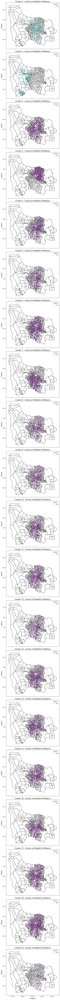


Descripción de características dentro de clusters:
                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.244815 -75.573171  0.141469  -0.332613        0.120950   
1               6.239295 -75.636689  0.291228  34.010526        0.933333   
2               6.247673 -75.578941  1.000000  33.977151        7.288978   
3               6.278266 -75.566440  0.028962  31.594952        0.479520   
4               6.252675 -75.570230  0.007681  32.068651        0.486798   
5               6.243538 -75.575029  1.000000  35.693002        0.289503   
6               6.249525 -75.578198  1.000000  33.080046        0.500387   
7               6.233667 -75.582046  0.000000  33.011439        0.585240   
8               6.245435 -75.576763  0.331157  31.812463        7.629674   
9               6.249136 -75.576536  0.323498  34.080084        1.659642   
10              6.242299 -75.576826 

In [243]:
# Calcular estadísticas descriptivas dentro de cada cluster
cluster_descriptions = datos_regresion.groupby('kmeans_cluster').mean()
print(cluster_descriptions)

# Número de clusters
num_clusters = len(cluster_descriptions)

# Crear subplots
fig, axes = plt.subplots(num_clusters, 1, figsize=(10, num_clusters * 6), sharex=True, sharey=True)

# Asegurar que axes es una lista para iterar sobre ella
if num_clusters == 1:
    axes = [axes]

# Plotear cada cluster por separado
for i, ax in enumerate(axes):
    # Trazar el mapa de los barrios
    barrios_solo.plot(ax=ax, edgecolor='black', color='white')

    # Filtrar datos del cluster actual
    cluster_data = hurto_barrios[hurto_barrios['kmeans_cluster'] == i]

    # Superponer los puntos de los clusters
    sns.scatterplot(
        x='longitud', y='latitud', hue='kmeans_cluster',
        data=cluster_data, palette='viridis', alpha=0.6, s=20, ax=ax
    )

    ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=15)
    ax.set_xlabel('Longitud', fontsize=12)
    ax.set_ylabel('Latitud', fontsize=12)
    ax.legend(title='Cluster', fontsize=10, loc='upper right')

# Ajustar la visualización global
plt.tight_layout()
plt.show()

# Mostrar las características de cada cluster
print("\nDescripción de características dentro de clusters:")
print(cluster_descriptions)

                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.244815 -75.573171  0.141469  -0.332613        0.120950   
1               6.239295 -75.636689  0.291228  34.010526        0.933333   
2               6.247673 -75.578941  1.000000  33.977151        7.288978   
3               6.278266 -75.566440  0.028962  31.594952        0.479520   
4               6.252675 -75.570230  0.007681  32.068651        0.486798   
5               6.243538 -75.575029  1.000000  35.693002        0.289503   
6               6.249525 -75.578198  1.000000  33.080046        0.500387   
7               6.233667 -75.582046  0.000000  33.011439        0.585240   
8               6.245435 -75.576763  0.331157  31.812463        7.629674   
9               6.249136 -75.576536  0.323498  34.080084        1.659642   
10              6.242299 -75.576826  0.014448  31.511352        0.662023   
11          

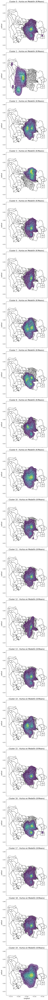


Descripción de características dentro de clusters:
                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.244815 -75.573171  0.141469  -0.332613        0.120950   
1               6.239295 -75.636689  0.291228  34.010526        0.933333   
2               6.247673 -75.578941  1.000000  33.977151        7.288978   
3               6.278266 -75.566440  0.028962  31.594952        0.479520   
4               6.252675 -75.570230  0.007681  32.068651        0.486798   
5               6.243538 -75.575029  1.000000  35.693002        0.289503   
6               6.249525 -75.578198  1.000000  33.080046        0.500387   
7               6.233667 -75.582046  0.000000  33.011439        0.585240   
8               6.245435 -75.576763  0.331157  31.812463        7.629674   
9               6.249136 -75.576536  0.323498  34.080084        1.659642   
10              6.242299 -75.576826 

In [244]:
cluster_descriptions = datos_regresion.groupby('kmeans_cluster').mean()
print(cluster_descriptions)

# Número de clusters
num_clusters = len(cluster_descriptions)

# Crear subplots
fig, axes = plt.subplots(num_clusters, 1, figsize=(10, num_clusters * 6), sharex=True, sharey=True)

# Asegurar que axes es una lista para iterar sobre ella
if num_clusters == 1:
    axes = [axes]

# Plotear cada cluster por separado
for i, ax in enumerate(axes):
    # Trazar el mapa de los barrios
    barrios_solo.plot(ax=ax, edgecolor='black', color='white')

    # Filtrar datos del cluster actual
    cluster_data = hurto_barrios[hurto_barrios['kmeans_cluster'] == i]

    # Superponer el KDE de los clusters
    sns.kdeplot(
        x=cluster_data['longitud'], y=cluster_data['latitud'],
        fill=True, cmap='viridis', alpha=0.6, ax=ax
    )

    ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=15)
    ax.set_xlabel('Longitud', fontsize=12)
    ax.set_ylabel('Latitud', fontsize=12)

# Ajustar la visualización global
plt.tight_layout()
plt.show()

# Mostrar las características de cada cluster
print("\nDescripción de características dentro de clusters:")
print(cluster_descriptions)

SVM

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV